<a href="https://colab.research.google.com/github/athriyagenferin/PVCK/blob/main/Week5.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


1. Buat Gamma Correction sesuai dengan petunjuk berikut
Percobaan ini akan meminta anda membuat Gamma Correction. Pada percobaan ini, nilai
Gamma akan diset dengan meminta masukan dari pengguna. Berikut adalah kode untuk
meminta masukan nilai dari pengguna. Lanjutkan kode tersebut dengan membuat image
dengan gamma correction sesuai rumus yang telah diberikan.

 Gamma Correction pada citra 
-----------------------------------
Masukkan nilai gamma: 5


Text(0.5, 1.0, 'Citra Correction')

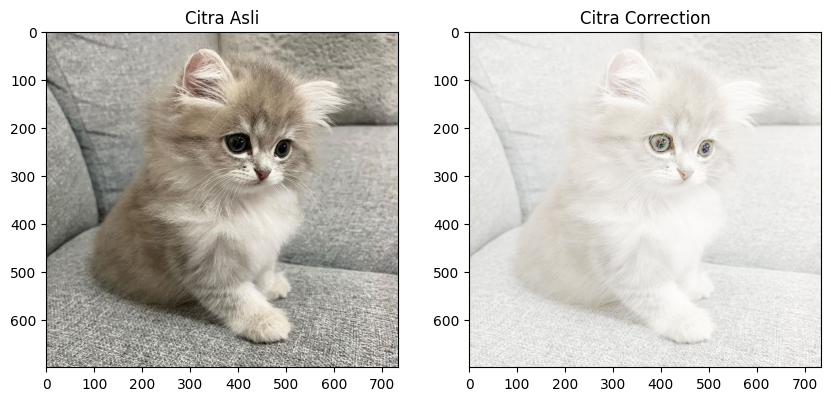

In [4]:
import cv2 as cv
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow
import numpy as np
img = cv.imread('/content/drive/MyDrive/PCVK/kitten01.jpeg')
img = cv.cvtColor(img, cv.COLOR_BGR2RGB)

print(' Gamma Correction pada citra ')
print('-----------------------------------')
try:
    gamma = int(input('Masukkan nilai gamma: '))
except ValueError:
    print('Error,  not a number')

def gamma_correction(image, gamma):
    image = 255 * (image / 255) ** (1 / gamma)
    return np.clip(image, 0, 255).astype(np.uint8)

img_gamma = gamma_correction(img, gamma)

fig, ax = plt.subplots(1, 2, figsize=(10, 5))

ax[0].imshow(img)
ax[0].set_title('Citra Asli')

ax[1].imshow(img_gamma)
ax[1].set_title('Citra Correction')


2. Buat Simulasi Image Depth
Percobaan ini digunakan sebagai simulasi dari proses kuantisasi citra. Pada kuantisasi citra,
pixel dapat direpresentasikan dengan n-bit kedalaman (default menggunakan 8-bit). Pada
pixel 8-bit, warna yang memungkinkan adalah 256 warna, dari 0 (0000 0000) hingga
255(1111 1111). Pada pixel 7-bit, warna yang memungkinkan adalah 128 warna, dari 0 (000
0000) hingga 127 (111 1111). Kemungkinan warna didapat dari pangkat 2 jumlah bit. Jika
7bit, maka jumlah warnanya adalah 27
= 128, dst.

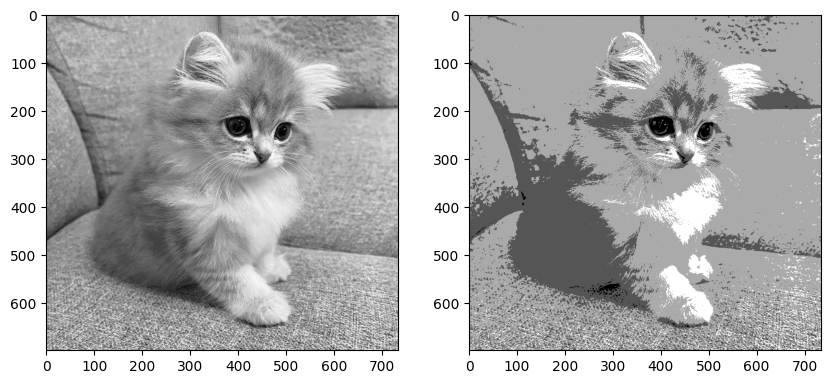

In [5]:
bit_depth = 2
level = 255 / (pow(2, bit_depth) - 1)
original = cv.imread('/content/drive/MyDrive/PCVK/kitten01.jpeg', cv.IMREAD_GRAYSCALE)
depth_image = np.zeros(original.shape, original.dtype)

def bit_depth_reduction(image, level):
    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
            depth_image[i, j] = level * round(image[i, j] / level)
    return depth_image

depth_image = bit_depth_reduction(original, level)

fig, ax = plt.subplots(1, 2, figsize=(10, 5))

ax[0].imshow(original, cmap='gray')

ax[1].imshow(depth_image, cmap='gray')

plt.show()

3. Buat modul Average Denoising
Buat modul average denoising sesuai dengan rumus yang telah diberikan pada sub bab
sebelumnya.
Citra asli sudah disediakan pada /images/galaxy.jpg.
100 Citra dengan Gaussian Noise sudah disediakan pada /images/noises/*.jpg
Anda dapat menggunakan code berikut untuk membaca semua image dalam satu folder ,
gunakan modul glob (import glob).

Nilai PSNR dengan 5 citra :  18.172579931766258  dB


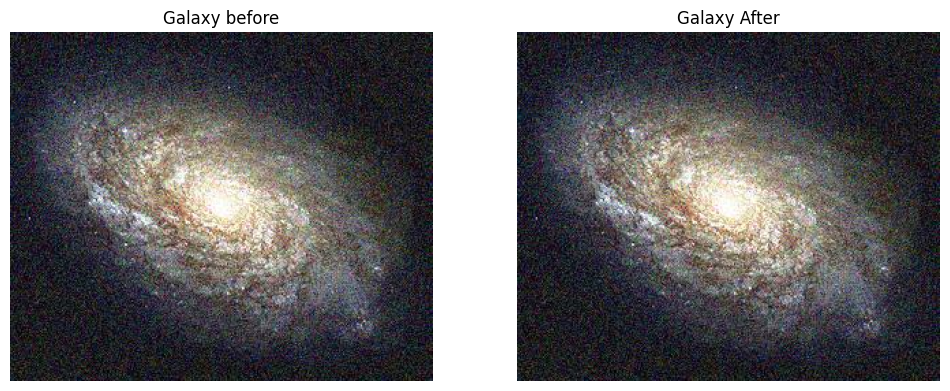

In [5]:
import glob
import cv2 as cv
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow
import numpy as np
from math import sqrt, log10

def PSNR(img1, img2):
  mse = np.mean((img1-img2)**2)
  if(mse==0):
    return 100
  max_pixel = 255.0
  psnr = 20 * log10(max_pixel / sqrt(mse))
  return psnr

# membaca citra asli
original_img = cv.imread('/content/drive/MyDrive/PCVK/Images/galaxy.jpg')

# membaca semua citra yang tersimpan dalam satu folder
cv_img = []
for img in glob.glob('/content/drive/MyDrive/PCVK/Images/noises/*.jpg'):
  n = cv.imread(img)
  cv_img.append(n)

denoised_img = np.zeros(cv_img[0].shape)
jmlGambar = 1
for i in range(jmlGambar):
  denoised_img = denoised_img + cv_img[i]
denoised_img = np.uint16(denoised_img/jmlGambar)

psnr = PSNR(original_img,denoised_img)

print('Nilai PSNR dengan 5 citra : ', psnr, ' dB')
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(cv_img[0], cv2.COLOR_BGR2RGB))
plt.title('Galaxy before')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(denoised_img, cv2.COLOR_BGR2RGB))
plt.title('Galaxy After')
plt.axis('off')

plt.show()


Nilai PSNR dengan 10 citra :  19.735842412860315  dB


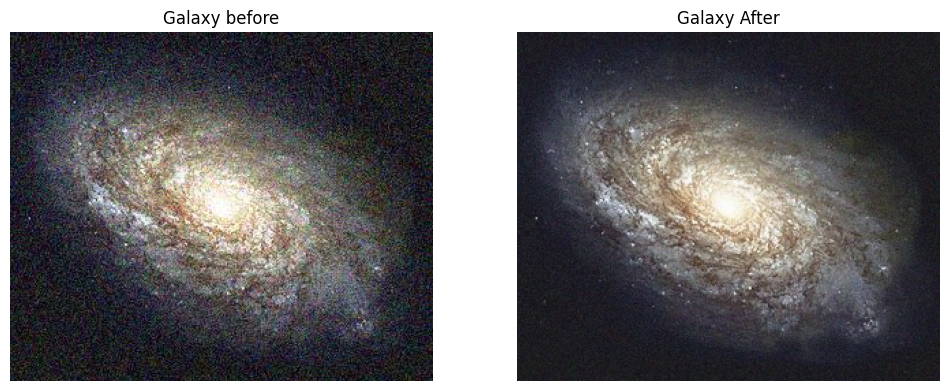

In [6]:
# membaca citra asli
original_img = cv.imread('/content/drive/MyDrive/PCVK/Images/galaxy.jpg')

# membaca semua citra yang tersimpan dalam satu folder
cv_img = []
for img in glob.glob('/content/drive/MyDrive/PCVK/Images/noises/*.jpg'):
  n = cv.imread(img)
  cv_img.append(n)

denoised_img = np.zeros(cv_img[0].shape)
jmlGambar = 10
for i in range(jmlGambar):
  denoised_img = denoised_img + cv_img[i]
denoised_img = np.uint16(denoised_img/jmlGambar)

psnr = PSNR(original_img,denoised_img)

print('Nilai PSNR dengan 10 citra : ', psnr, ' dB')
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(cv_img[0], cv2.COLOR_BGR2RGB))
plt.title('Galaxy before')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(denoised_img, cv2.COLOR_BGR2RGB))
plt.title('Galaxy After')
plt.axis('off')

plt.show()

Nilai PSNR dengan 20 citra :  19.84369323382358  dB


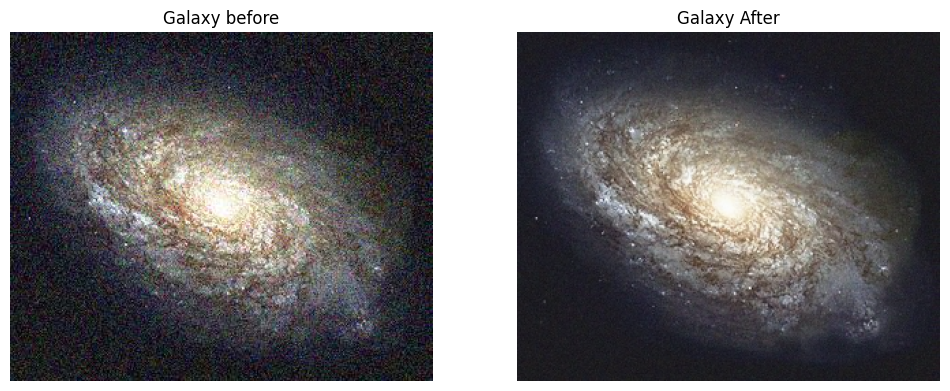

In [7]:
# membaca citra asli
original_img = cv.imread('/content/drive/MyDrive/PCVK/Images/galaxy.jpg')

# membaca semua citra yang tersimpan dalam satu folder
cv_img = []
for img in glob.glob('/content/drive/MyDrive/PCVK/Images/noises/*.jpg'):
  n = cv.imread(img)
  cv_img.append(n)

denoised_img = np.zeros(cv_img[0].shape)
jmlGambar = 20
for i in range(jmlGambar):
  denoised_img = denoised_img + cv_img[i]
denoised_img = np.uint16(denoised_img/jmlGambar)

psnr = PSNR(original_img,denoised_img)

print('Nilai PSNR dengan 20 citra : ', psnr, ' dB')
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(cv_img[0], cv2.COLOR_BGR2RGB))
plt.title('Galaxy before')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(denoised_img, cv2.COLOR_BGR2RGB))
plt.title('Galaxy After')
plt.axis('off')

plt.show()

Nilai PSNR dengan 40 citra :  19.89199188319398  dB


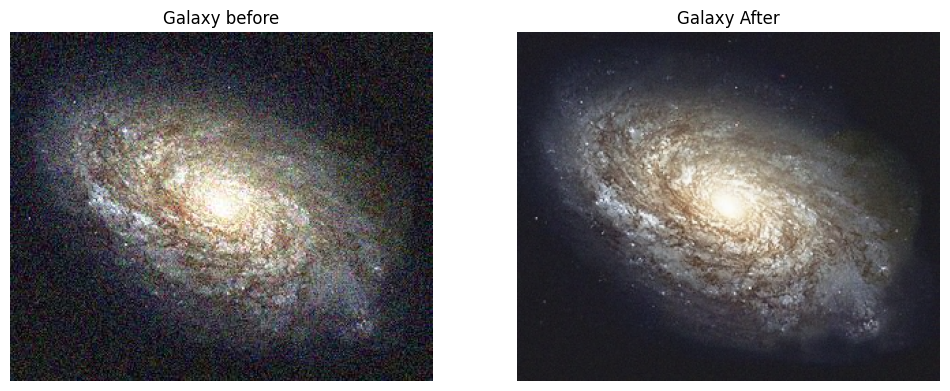

In [8]:
# membaca citra asli
original_img = cv.imread('/content/drive/MyDrive/PCVK/Images/galaxy.jpg')

# membaca semua citra yang tersimpan dalam satu folder
cv_img = []
for img in glob.glob('/content/drive/MyDrive/PCVK/Images/noises/*.jpg'):
  n = cv.imread(img)
  cv_img.append(n)

denoised_img = np.zeros(cv_img[0].shape)
jmlGambar = 40
for i in range(jmlGambar):
  denoised_img = denoised_img + cv_img[i]
denoised_img = np.uint16(denoised_img/jmlGambar)

psnr = PSNR(original_img,denoised_img)
print('Nilai PSNR dengan 40 citra : ', psnr, ' dB')
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(cv_img[0], cv2.COLOR_BGR2RGB))
plt.title('Galaxy before')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(denoised_img, cv2.COLOR_BGR2RGB))
plt.title('Galaxy After')
plt.axis('off')

plt.show()

Nilai PSNR dengan 80 citra :  19.917197250927426  dB


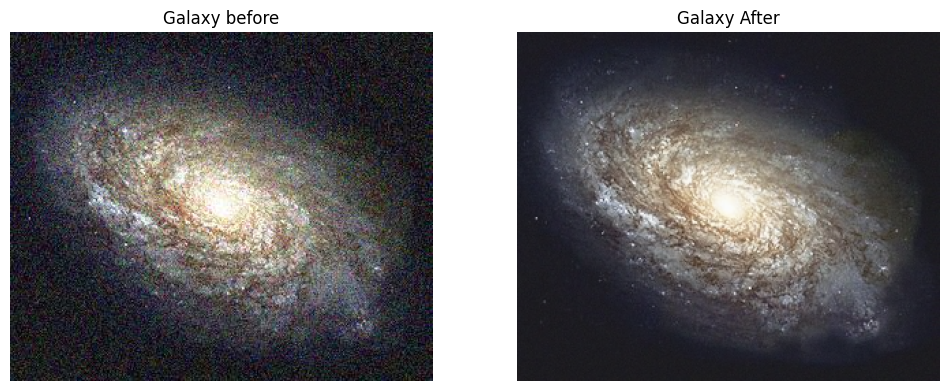

In [9]:
# membaca citra asli
original_img = cv.imread('/content/drive/MyDrive/PCVK/Images/galaxy.jpg')

# membaca semua citra yang tersimpan dalam satu folder
cv_img = []
for img in glob.glob('/content/drive/MyDrive/PCVK/Images/noises/*.jpg'):
  n = cv.imread(img)
  cv_img.append(n)

denoised_img = np.zeros(cv_img[0].shape)
jmlGambar = 80
for i in range(jmlGambar):
  denoised_img = denoised_img + cv_img[i]
denoised_img = np.uint16(denoised_img/jmlGambar)

psnr = PSNR(original_img,denoised_img)

print('Nilai PSNR dengan 80 citra : ', psnr, ' dB')
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(cv_img[0], cv2.COLOR_BGR2RGB))
plt.title('Galaxy before')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(denoised_img, cv2.COLOR_BGR2RGB))
plt.title('Galaxy After')
plt.axis('off')

plt.show()

Nilai PSNR dengan 100 citra :  19.92196095594035  dB


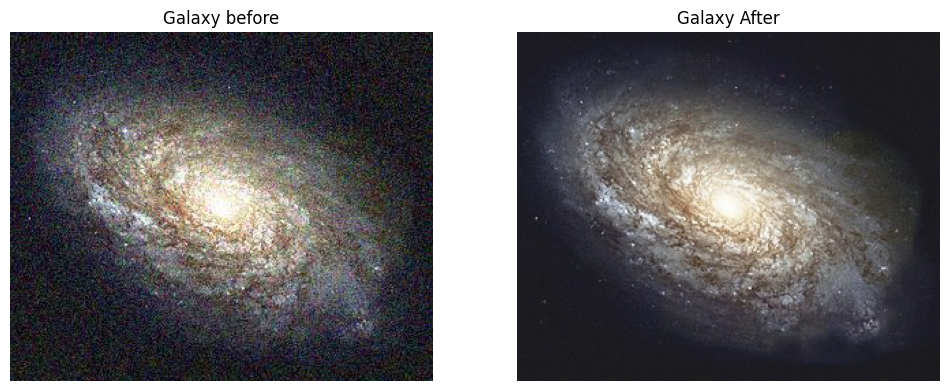

In [10]:
# membaca citra asli
original_img = cv.imread('/content/drive/MyDrive/PCVK/Images/galaxy.jpg')

# membaca semua citra yang tersimpan dalam satu folder
cv_img = []
for img in glob.glob('/content/drive/MyDrive/PCVK/Images/noises/*.jpg'):
  n = cv.imread(img)
  cv_img.append(n)

denoised_img = np.zeros(cv_img[0].shape)
jmlGambar = 100
for i in range(jmlGambar):
  denoised_img = denoised_img + cv_img[i]
denoised_img = np.uint16(denoised_img/jmlGambar)

psnr = PSNR(original_img,denoised_img)

print('Nilai PSNR dengan 100 citra : ', psnr, ' dB')
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(cv_img[0], cv2.COLOR_BGR2RGB))
plt.title('Galaxy before')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(denoised_img, cv2.COLOR_BGR2RGB))
plt.title('Galaxy After')
plt.axis('off')

plt.show()

KESIMPULAN

Semakin banyak jumlah gambar yang digunakan dalam perhitungan denoised_img, maka nilai hasil PNSR semakin tinggi. Jika nilai hasil PNSR tinggi, maka hasil gambar akan semakin jernih/bagus.

4. Buat image masking untuk image berikut. Image kiri adalah image asli (image KTP),
sedangkan image paling kanan adalah hasilnya:

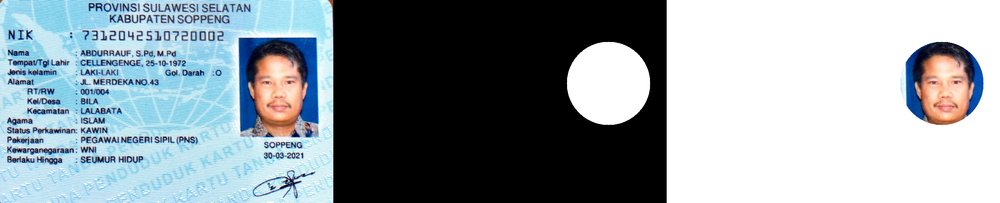

In [22]:
# menggunakan operator and
img = cv.imread('/content/drive/MyDrive/PCVK/Images/KTP_More/KTP_More/KTP7.jpeg')
mask = np.zeros(img.shape,dtype=np.uint8)
mask = cv.circle(mask, (660,200), 100, (255,255,255), -1)

result = img & mask
result[mask==0] = 255

final_frame = cv.hconcat((img,mask,result))
cv2_imshow(final_frame)

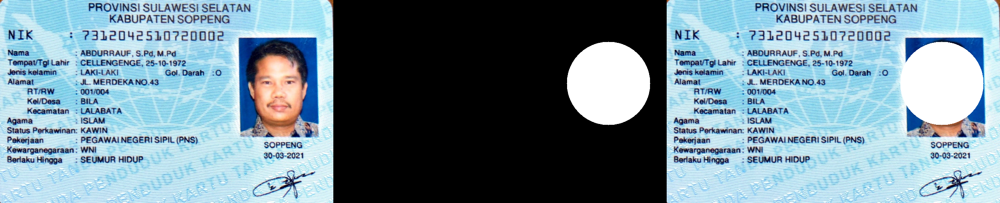

In [23]:
# menggunakan operator or

mask = np.zeros(img.shape,img.dtype)
mask = cv.circle(mask, (660,200), 100, (255,255,255), -1)

result = img & mask

masked = img | mask

final_frame = cv.hconcat((img,mask,masked))
cv2_imshow(final_frame)


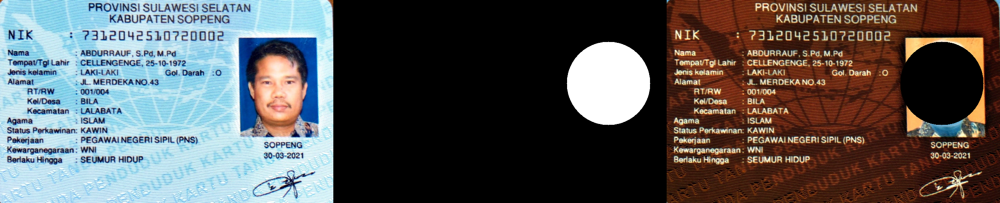

In [24]:
# menggunakan operator not

mask = np.zeros(img.shape,dtype=np.uint8)
mask = cv.circle(mask, (660,200), 100, (255,255,255), -1)

result = img & mask

masked = ~img & ~mask

final_frame = cv.hconcat((img, mask, masked))
cv2_imshow(final_frame)


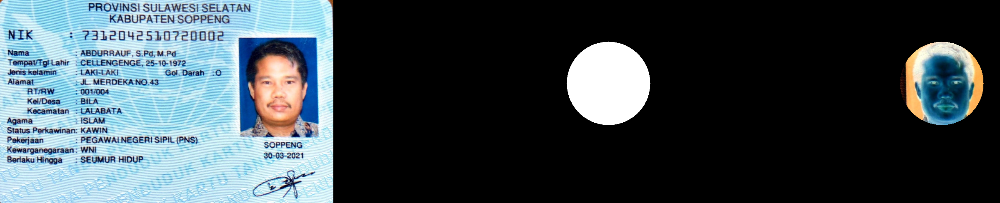

In [25]:
# menggunakan operator nand

mask = np.zeros(img.shape,dtype=np.uint8)
mask = cv.circle(mask, (660,200), 100, (255,255,255), -1)

masked = ~img & mask

final_frame = cv.hconcat((img, mask, masked))
cv2_imshow(final_frame)

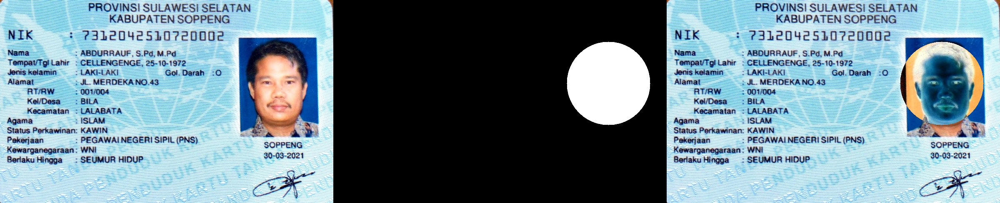

In [26]:
# menggunakan operator xor

mask = np.zeros(img.shape,dtype=np.uint8)
mask = cv.circle(mask, (660,200), 100, (255,255,255), -1)

masked = cv.bitwise_xor(img, mask)

final_frame = cv.hconcat((img, mask, masked))
cv2_imshow(final_frame)

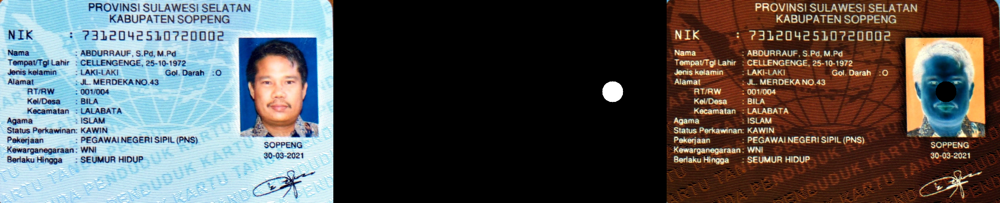

In [27]:
# menggunakan operator not
img = cv.imread('/content/drive/MyDrive/PCVK/Images/KTP_More/KTP_More/KTP7.jpeg')
mask = np.zeros(img.shape,dtype=np.uint8)
mask = cv.circle(mask, (670,220), 25, (255,255,255), -1)

result = img & mask

masked = ~img & ~mask

final_frame = cv.hconcat((img, mask, masked))
cv2_imshow(final_frame)

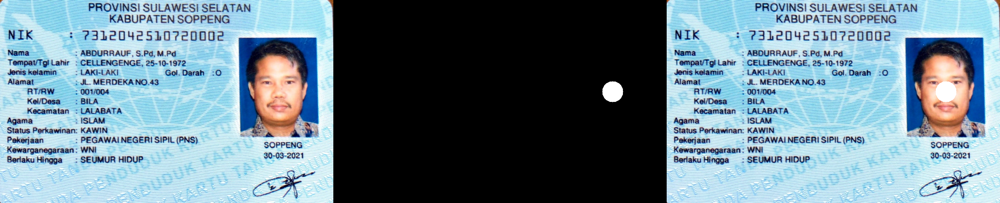

In [28]:
# menggunakan operator or

mask = np.zeros(img.shape,img.dtype)
mask = cv.circle(mask, (670,220), 25, (255,255,255), -1)

result = img & mask

masked = img | mask

final_frame = cv.hconcat((img,mask,masked))
cv2_imshow(final_frame)


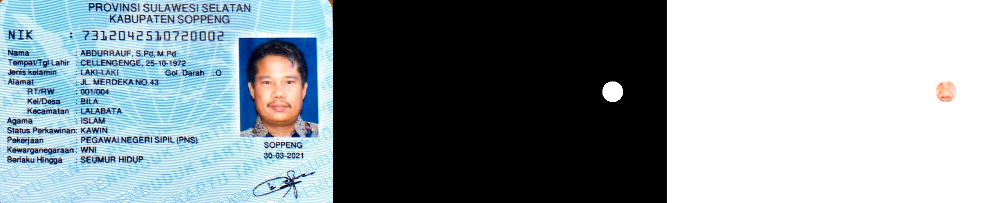

In [29]:
# menggunakan operator and

mask = np.zeros(img.shape,dtype=np.uint8)
mask = cv.circle(mask, (670,220), 25, (255,255,255), -1)

result = img & mask
result[mask==0] = 255

final_frame = cv.hconcat((img,mask,result))
cv2_imshow(final_frame)

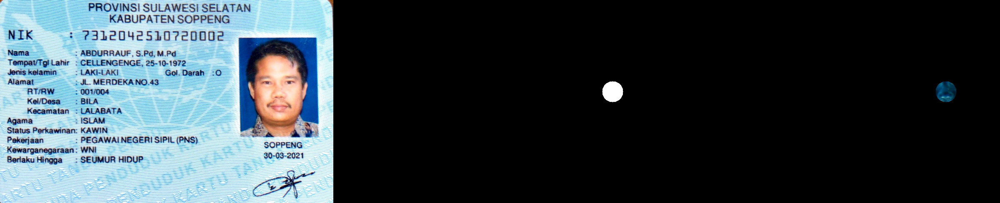

In [30]:

# menggunakan operator nand

mask = np.zeros(img.shape,dtype=np.uint8)
mask = cv.circle(mask, (670,220), 25, (255,255,255), -1)

masked = ~img & mask

final_frame = cv.hconcat((img, mask, masked))
cv2_imshow(final_frame)

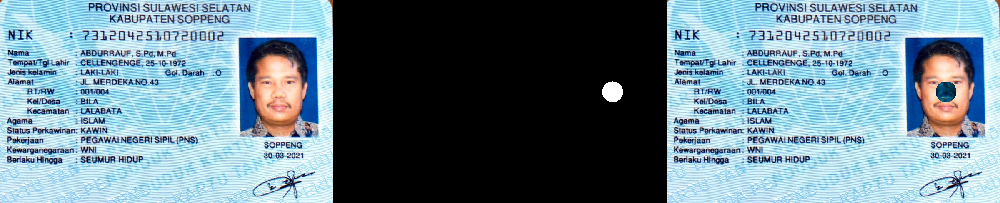

In [31]:
# menggunakan operator xor

mask = np.zeros(img.shape,dtype=np.uint8)
mask = cv.circle(mask, (670,220), 25, (255,255,255), -1)

masked = cv.bitwise_xor(img, mask)

final_frame = cv.hconcat((img, mask, masked))
cv2_imshow(final_frame)


Image masking digunakan dalam segmentasi objek untuk mengisolasi objek pada sebuah gambar dan menghilangkan background-nya.

Proses masking dapat dilakukan dengan operator logika seperti AND, OR, NOT, NAND, dan XOR.

- Operator **AND** akan menampilkan piksel hanya di area yang ditentukan.
- Operator **OR** akan menampilkan piksel di luar area yang dibuat.
- Operator **NOT** menampilkan piksel di luar area dan mengubah citra menjadi versi negatifnya (inverse).
- Operator **NAND** menampilkan piksel di area yang ditentukan sambil mengubah citra menjadi negatif.
- Operator **XOR** menampilkan semua piksel, tetapi piksel di area akan tetap normal, sedangkan yang di luar area akan menjadi negatif (inverse).